In [ ]:
                                                CUNNY DETECTION DAY-4

In [3]:
!pip install icrawler
!pip install pillow
!pip install matplotlib
!pip install cv2
!pip install base64
!pip install os
!pip install dash
!pip install opencv_python

ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2
ERROR: Could not find a version that satisfies the requirement base64 (from versions: none)
ERROR: No matching distribution found for base64
ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os


   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB 435.7 kB/s eta 0:01:30
   ---------------------------------------- 0.0/38.8 MB 435.7 kB/s eta 0:01:30
   ---------------------------------------- 0.0/38.8 MB 435.7 kB/s eta 0:01:30
   ---------------------------------------- 0.0/38.8 MB 435.7 kB/s eta 0:01:30
   ---------------------------------------- 0.0/38.8 MB 435.7 kB/s eta 0:01:30
   ---------------------------------------- 0.0/38.8 MB 435.7 kB/s eta 0:01:30
   ---------------------------------------- 0.1/38.8 MB 275.8 kB/s eta 0:02:21
   ---------------------------------------- 0.1/38.8 MB 312.2 kB/s eta 0:02:05
   ---------------------------------------- 0.1/38.8 MB 312.2 kB/s eta 0:02:05
   ---------------------------------------- 0.1/38.8 MB 312.2 kB/s eta 0:02:05
   ---------------------------------------- 0.1/38.8 MB 312.2 kB/s eta

In [1]:
import base64
import io
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.graph_objects as go
import cv2
import numpy as np
from dash.dependencies import Input, Output
from PIL import Image

# Initialize the Dash app
app = dash.Dash(__name__)

# Layout of the Dash app
app.layout = html.Div([
    html.H1("Canny Edge Detection with Interactive Sliders"),
    
    # Image upload
    dcc.Upload(
        id='upload-image',
        children=html.Button('Upload Image'),
        multiple=False
    ),
    
    # Sliders for blur kernel size and Canny thresholds
    dcc.Slider(
        id='kernel-size-slider',
        min=1,
        max=10,
        step=1,
        value=3,
        marks={i: str(i) for i in range(1, 11)},
        tooltip={"placement": "bottom", "always_visible": True},
        updatemode='drag'
    ),
    html.Div("Kernel Size for Blur"),
    
    dcc.Slider(
        id='lower-threshold-slider',
        min=0,
        max=255,
        step=1,
        value=100,
        marks={i: str(i) for i in range(0, 256, 50)},
        tooltip={"placement": "bottom", "always_visible": True},
        updatemode='drag'
    ),
    html.Div("Lower Threshold for Canny Edge Detection"),
    
    dcc.Slider(
        id='upper-threshold-slider',
        min=0,
        max=255,
        step=1,
        value=200,
        marks={i: str(i) for i in range(0, 256, 50)},
        tooltip={"placement": "bottom", "always_visible": True},
        updatemode='drag'
    ),
    html.Div("Upper Threshold for Canny Edge Detection"),
    
    # Graph for displaying the original image and edge detection results
    dcc.Graph(id='edge-detection-graph')
])

# Callback to update edge detection results based on sliders
@app.callback(
    Output('edge-detection-graph', 'figure'),
    [Input('kernel-size-slider', 'value'),
     Input('lower-threshold-slider', 'value'),
     Input('upper-threshold-slider', 'value'),
     Input('upload-image', 'contents')]
)
def update_image(kernel_size, lower_threshold, upper_threshold, uploaded_image):
    if uploaded_image is not None:
        # Decode the uploaded image and convert it to grayscale
        content_type, content_string = uploaded_image.split(',')
        decoded = base64.b64decode(content_string)
        img_array = np.frombuffer(decoded, np.uint8)
        img = cv2.imdecode(img_array, cv2.IMREAD_GRAYSCALE)
    else:
        return go.Figure()  # Return an empty figure if no image is uploaded

    if img is None:
        return go.Figure()  # If image could not be decoded, return an empty figure

    # Apply Gaussian Blur based on slider input
    kernel_size = kernel_size * 2 + 1  # Ensure odd number for kernel size
    blurred_image = cv2.GaussianBlur(img, (kernel_size, kernel_size), 1.4)

    # Apply Canny Edge Detection with selected thresholds
    edges = cv2.Canny(blurred_image, lower_threshold, upper_threshold)

    # Convert the images to RGB format for visualization
    img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # Create Plotly figure for the images (original + edge detection)
    fig = go.Figure()

    # Add original image
    fig.add_trace(go.Image(z=img_rgb))

    # Add edge detection result
    fig.add_trace(go.Image(z=edges_rgb))

    fig.update_layout(title="Canny Edge Detection")

    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


C:\Users\yamun\AppData\Local\Temp\ipykernel_4944\2082562859.py:4: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc
C:\Users\yamun\AppData\Local\Temp\ipykernel_4944\2082562859.py:5: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html


In [ ]:
                                                               SOBEL EDGE DETECTION

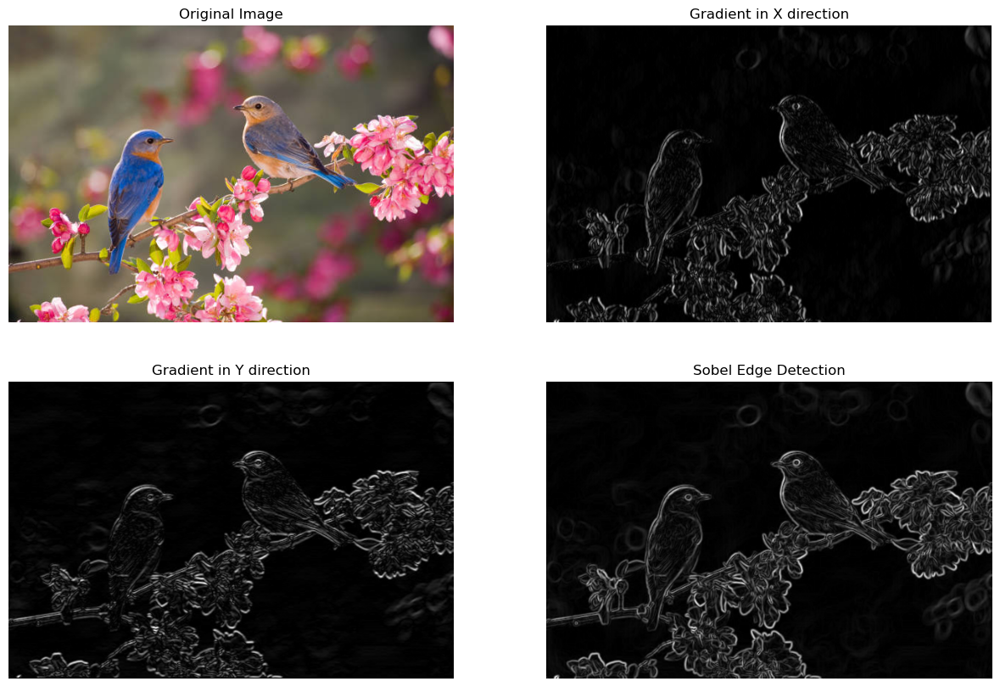

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = r"C:\Users\yamun\OneDrive\Pictures\yamu.jpg"  # Replace with your image path
image = cv2.imread(image_path)

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian smoothing (optional)
blurred_image = cv2.GaussianBlur(gray_image, (3, 3), 0)

# Sobel operators
Gx = cv2.Sobel(blurred_image, cv2.CV_64F, 1, 0, ksize=3)
Gy = cv2.Sobel(blurred_image, cv2.CV_64F, 0, 1, ksize=3)

# Gradient magnitude
G = np.sqrt(Gx**2 + Gy**2)

# Normalize to range 0-255
Gx = np.uint8(255 * np.abs(Gx) / np.max(Gx))
Gy = np.uint8(255 * np.abs(Gy) / np.max(Gy))
G = np.uint8(255 * G / np.max(G))

# Display the results
plt.figure(figsize=(15, 10))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Gradient in X direction
plt.subplot(2, 2, 2)
plt.imshow(Gx, cmap='gray')
plt.title('Gradient in X direction')
plt.axis('off')

# Gradient in Y direction
plt.subplot(2, 2, 3)
plt.imshow(Gy, cmap='gray')
plt.title('Gradient in Y direction')
plt.axis('off')

# Edge-detected image
plt.subplot(2, 2, 4)
plt.imshow(G, cmap='gray')
plt.title('Sobel Edge Detection')
plt.axis('off')

plt.show()

In [ ]:
                                             CUNNY DETECTION

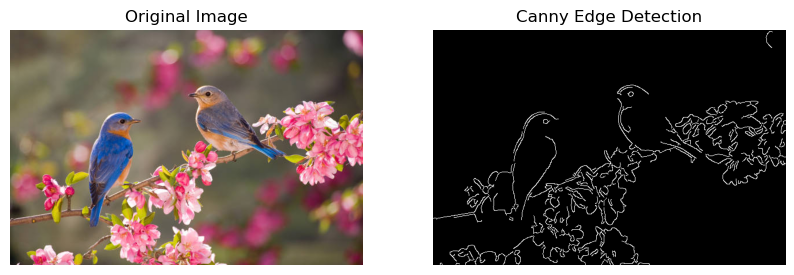

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = r"C:\Users\yamun\OneDrive\Pictures\yamu.jpg"  # Replace with your image path
image = cv2.imread(image_path, cv2.IMREAD_COLOR)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to reduce noise
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 1.4)

# Apply Canny edge detector
edges = cv2.Canny(blurred_image, 100, 200)

# Display the result
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Edge-detected image
plt.subplot(1, 2, 2)
plt.imshow(edges, cmap='gray')
plt.title('Canny Edge Detection')
plt.axis('off')

plt.show()


In [ ]:
                                                     SOBEL DETECTION
                                                        DAY 5.IPYNB

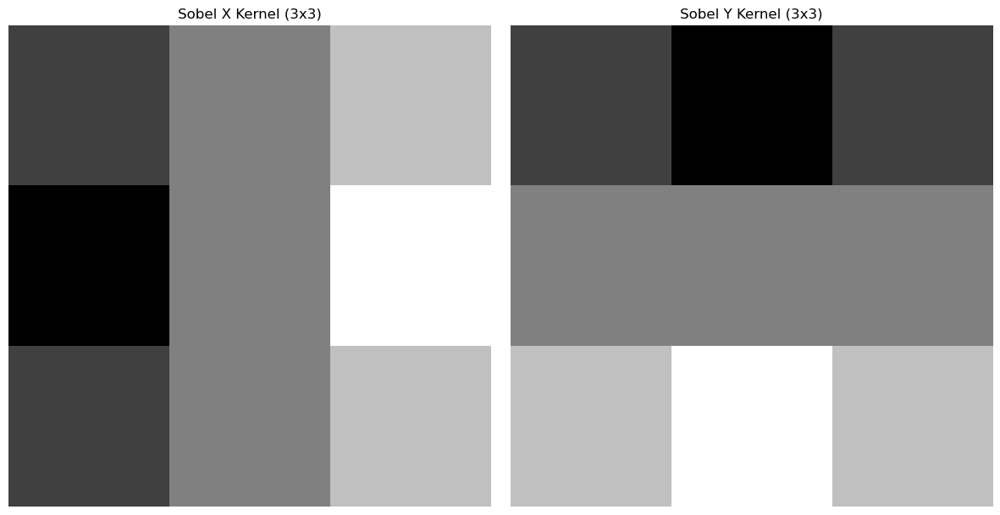

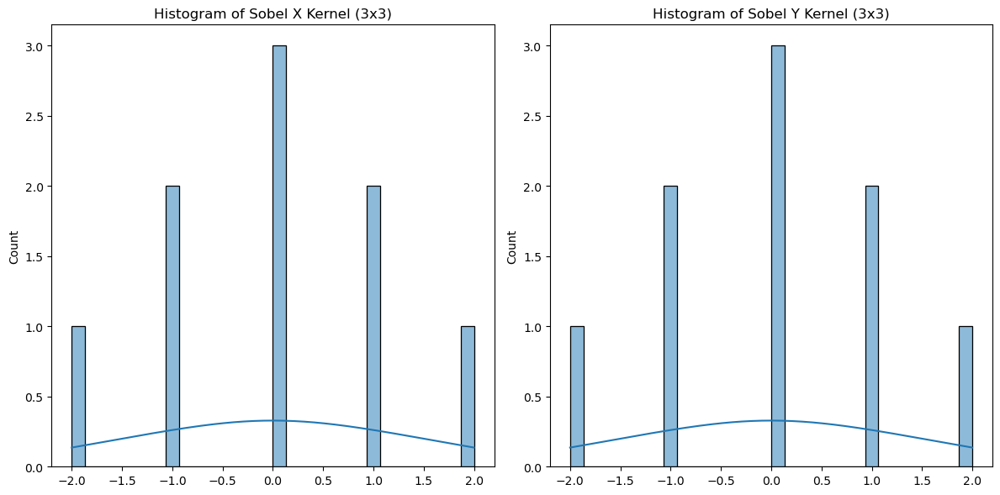

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Sobel 3x3 kernels
sobel_x_3x3 = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])

sobel_y_3x3 = np.array([
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]
])

# Plot the Sobel X and Sobel Y kernels as images (3x3)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Display Sobel X (3x3)
ax[0].imshow(sobel_x_3x3, cmap='gray', interpolation='nearest')
ax[0].set_title('Sobel X Kernel (3x3)')
ax[0].axis('off')

# Display Sobel Y (3x3)
ax[1].imshow(sobel_y_3x3, cmap='gray', interpolation='nearest')
ax[1].set_title('Sobel Y Kernel (3x3)')
ax[1].axis('off')

plt.tight_layout()
plt.show()

# Plot the histograms of the Sobel X and Sobel Y kernels (3x3)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot histogram for Sobel X (3x3)
sns.histplot(sobel_x_3x3.flatten(), kde=True, bins=30, ax=ax[0])
ax[0].set_title('Histogram of Sobel X Kernel (3x3)')

# Plot histogram for Sobel Y (3x3)
sns.histplot(sobel_y_3x3.flatten(), kde=True, bins=30, ax=ax[1])
ax[1].set_title('Histogram of Sobel Y Kernel (3x3)')

plt.tight_layout()
plt.show()


In [ ]:
                                                    DAY 4 EDGE DETECTION 

In [26]:
!pip install numpy
!pip install icrawler
!pip install pillow
!pip install matplotlib
!pip install cv2
!pip install base64
!pip install os
!pip install dash
!pip install opencv_python

  Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl (15.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.1.3
    Uninstalling numpy-2.1.3:
      Successfully uninstalled numpy-2.1.3


ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2
ERROR: Could not find a version that satisfies the requirement base64 (from versions: none)
ERROR: No matching distribution found for base64
ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os


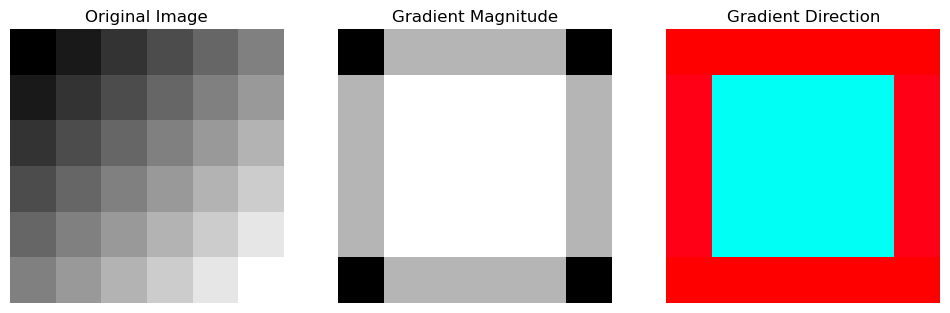

Sobel X (Horizontal Gradient):
 [[ 0. 80. 80. 80. 80.  0.]
 [ 0. 80. 80. 80. 80.  0.]
 [ 0. 80. 80. 80. 80.  0.]
 [ 0. 80. 80. 80. 80.  0.]
 [ 0. 80. 80. 80. 80.  0.]
 [ 0. 80. 80. 80. 80.  0.]]
Sobel Y (Vertical Gradient):
 [[ 0.  0.  0.  0.  0.  0.]
 [80. 80. 80. 80. 80. 80.]
 [80. 80. 80. 80. 80. 80.]
 [80. 80. 80. 80. 80. 80.]
 [80. 80. 80. 80. 80. 80.]
 [ 0.  0.  0.  0.  0.  0.]]
Gradient Magnitude:
 [[  0.          80.          80.          80.          80.
    0.        ]
 [ 80.         113.13708499 113.13708499 113.13708499 113.13708499
   80.        ]
 [ 80.         113.13708499 113.13708499 113.13708499 113.13708499
   80.        ]
 [ 80.         113.13708499 113.13708499 113.13708499 113.13708499
   80.        ]
 [ 80.         113.13708499 113.13708499 113.13708499 113.13708499
   80.        ]
 [  0.          80.          80.          80.          80.
    0.        ]]
Gradient Direction:
 [[0.         0.         0.         0.         0.         0.        ]
 [1.57079633 0.785

In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import numpy.core.multiarray

# Example 6x6 image matrix
image = np.array([[10, 20, 30, 40, 50, 60],
                  [20, 30, 40, 50, 60, 70],
                  [30, 40, 50, 60, 70, 80],
                  [40, 50, 60, 70, 80, 90],
                  [50, 60, 70, 80, 90, 100],
                  [60, 70, 80, 90, 100, 110]], dtype=np.uint8)

# Apply Sobel operator to calculate the gradient in the x and y directions
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # Gradient in x direction (horizontal)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Gradient in y direction (vertical)

# Calculate the gradient magnitude
magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

# Calculate the gradient direction (optional)
direction = np.arctan2(sobel_y, sobel_x)

# Display the results
plt.figure(figsize=(12, 6))

# Plot the original image
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Plot the gradient magnitude
plt.subplot(1, 3, 2)
plt.imshow(magnitude, cmap='gray')
plt.title('Gradient Magnitude')
plt.axis('off')

# Plot the gradient direction
plt.subplot(1, 3, 3)
plt.imshow(direction, cmap='hsv')
plt.title('Gradient Direction')
plt.axis('off')

plt.show()

# Print the computed results for clarity
print("Sobel X (Horizontal Gradient):\n", sobel_x)
print("Sobel Y (Vertical Gradient):\n", sobel_y)
print("Gradient Magnitude:\n", magnitude)
print("Gradient Direction:\n", direction)



In [36]:
!pip install numpy

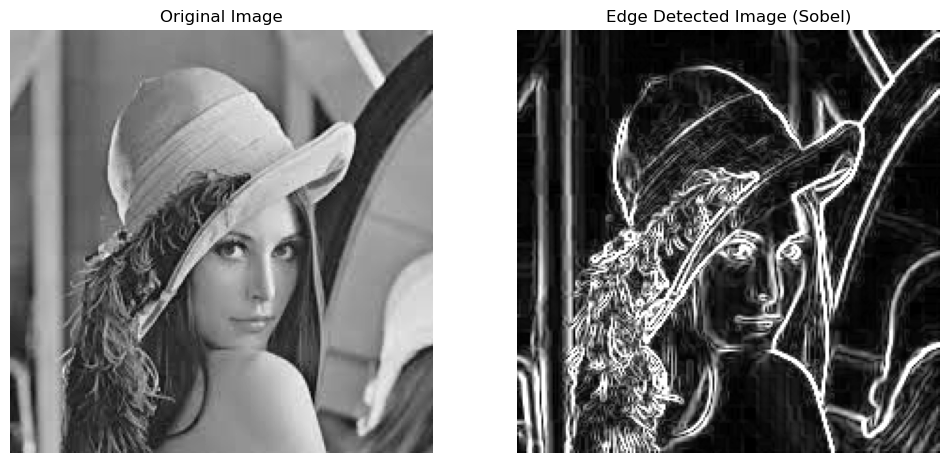

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (you can replace 'your_image.jpg' with your own image file path)
image = cv2.imread(r"C:\Users\yamun\OneDrive\Pictures\lenna.jpg", cv2.IMREAD_GRAYSCALE)

# Check if the image was loaded successfully
if image is None:
    print("Error: Image not found")
    exit()

# Apply Sobel operator to calculate the gradient in the x and y directions
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # Gradient in x direction
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Gradient in y direction

# Calculate the gradient magnitude
magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

# Convert magnitude to uint8 for display
magnitude_display = np.uint8(np.clip(magnitude, 0, 255))

# Plot the original and processed images
plt.figure(figsize=(12, 6))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Plot the edge-detected image (gradient magnitude)
plt.subplot(1, 2, 2)
plt.imshow(magnitude_display, cmap='gray')
plt.title('Edge Detected Image (Sobel)')
plt.axis('off')

plt.show()


In [ ]:
                                                        DAY-3 INSTALLATION LIBRARIES

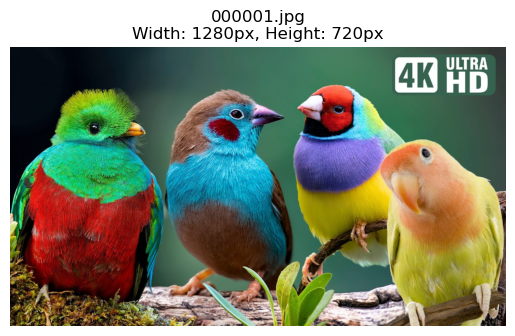

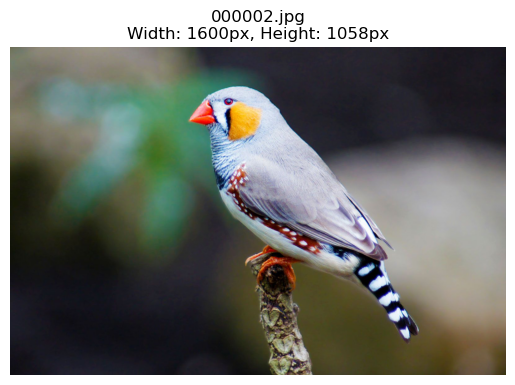

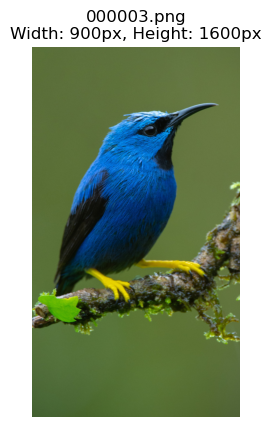

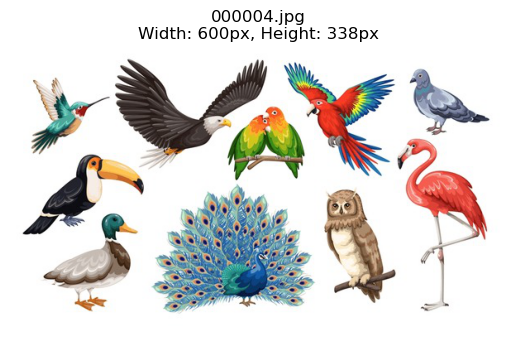

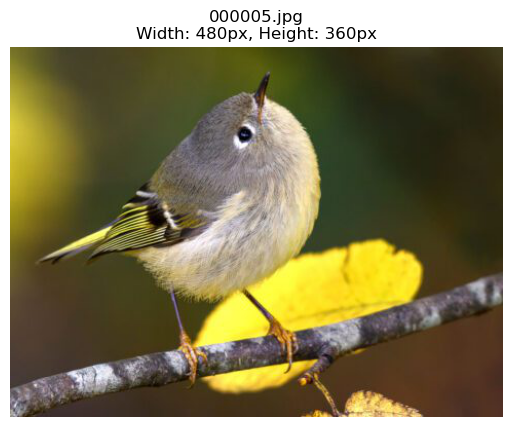

...

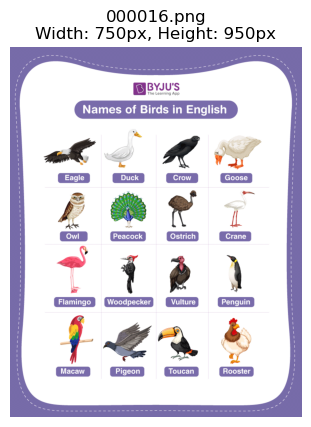

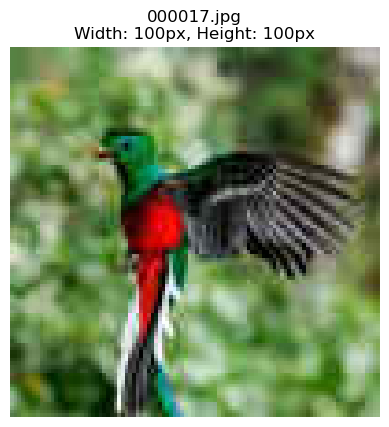

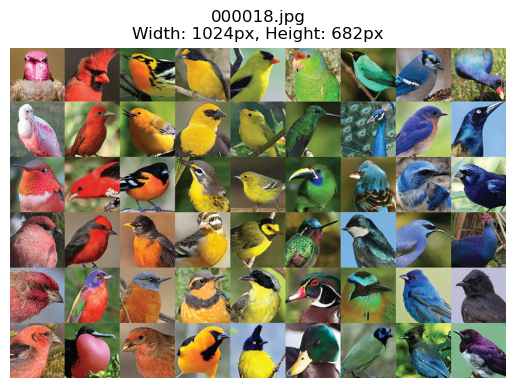

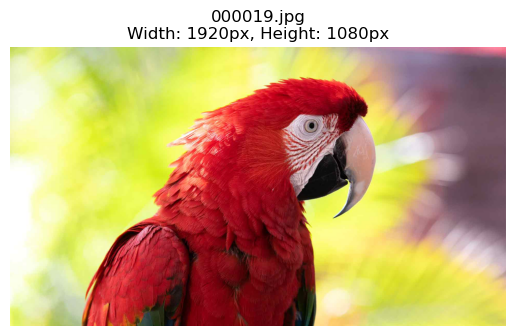

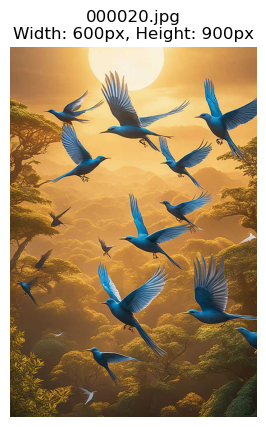

In [5]:
# Step 1: Install the Pillow library (PIL) and matplotlib in Colab
from PIL import Image
import os
import matplotlib.pyplot as plt

# Define the directory where images are stored (update this if needed)
image_dir = "/content/DataDownloadTech/birds"

# Check if the directory exists and contains images
if os.path.exists(image_dir) and os.listdir(image_dir):
    # Loop through all files in the directory
    for filename in os.listdir(image_dir):
        if filename.endswith(".jpg") or filename.endswith(".png"):  # Check for image file types
            image_path = os.path.join(image_dir, filename)

            # Open image and get its dimensions
            with Image.open(image_path) as img:
                width, height = img.size

                # Display the image with its dimensions
                plt.imshow(img)
                plt.axis('off')  # Turn off axis
                plt.title(f"{filename}\nWidth: {width}px, Height: {height}px", fontsize=12)
                plt.show()
else:
    print(f"No images found in the directory {image_dir}")


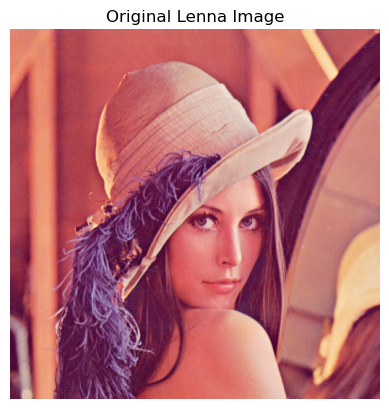

In [6]:
# Step 1: Download the Lenna image
import urllib.request
from PIL import Image
import matplotlib.pyplot as plt

# URL for Lenna image
url = "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png"
filename = "Lenna.png"

# Download the image
urllib.request.urlretrieve(url, filename)

# Load the image
image = Image.open(filename)

# Display the original image
plt.imshow(image)
plt.axis('off')
plt.title("Original Lenna Image")
plt.show()


Original Dimensions: Width = 512px, Height = 512px


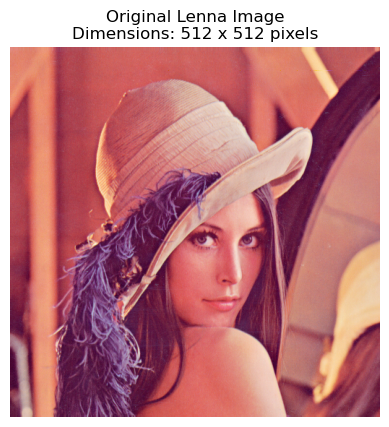

In [7]:
from PIL import Image  # Importing Image from PIL (Python Imaging Library)
import urllib.request
import matplotlib.pyplot as plt

# Step 1: Download the Lenna image
url = "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png"
filename = "Lenna.png"
urllib.request.urlretrieve(url, filename)

# Step 2: Load the image
original_img = Image.open(filename)

# Step 3: Get the dimensions
width, height = original_img.size
print(f"Original Dimensions: Width = {width}px, Height = {height}px")

# Step 4: Display the image
plt.imshow(original_img)
plt.axis('off')
plt.title(f"Original Lenna Image\nDimensions: {width} x {height} pixels")
plt.show()


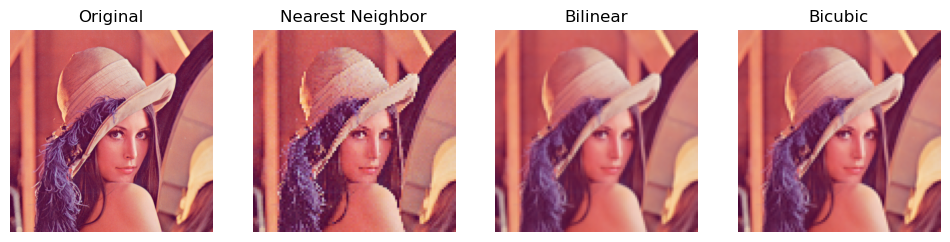

In [8]:
from PIL import Image
import urllib.request
import matplotlib.pyplot as plt

# Download the Lenna image
url = "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png"
filename = "Lenna.png"
urllib.request.urlretrieve(url, filename)

# Load the image
image = Image.open(filename)

# Define new size
new_size = (100, 100)  # Resize to 100x100 pixels for noticeable effects

# Step 2: Apply different resizing techniques
nearest = image.resize(new_size, Image.NEAREST)  # Nearest neighbor interpolation
bilinear = image.resize(new_size, Image.BILINEAR)  # Bilinear interpolation
bicubic = image.resize(new_size, Image.BICUBIC)  # Bicubic interpolation

# Step 3: Display the original and resized images side by side
plt.figure(figsize=(12, 8))

# Original Image
plt.subplot(1, 4, 1)
plt.imshow(image)
plt.axis('off')
plt.title("Original")

# Nearest Neighbor
plt.subplot(1, 4, 2)
plt.imshow(nearest)
plt.axis('off')
plt.title("Nearest Neighbor")

# Bilinear
plt.subplot(1, 4, 3)
plt.imshow(bilinear)
plt.axis('off')
plt.title("Bilinear")

# Bicubic
plt.subplot(1, 4, 4)
plt.imshow(bicubic)
plt.axis('off')
plt.title("Bicubic")

plt.show()


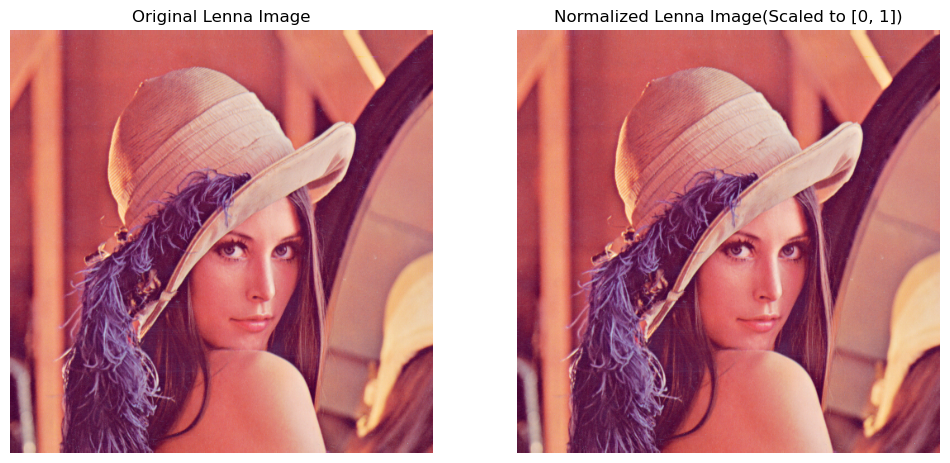

In [9]:
# Step 1: Import required libraries and download the Lenna image
import urllib.request
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# URL for Lenna image
url = "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png"
filename = "Lenna.png"

# Download the image
urllib.request.urlretrieve(url, filename)

# Load the image
image = Image.open(filename)

# Convert the image to a numpy array for processing
image_array = np.array(image)

# Step 2: Normalize the image (scale pixel values to range [0, 1])
normalized_image_array = image_array / 255.0

# Convert the normalized array back to an image for visualization
normalized_image = Image.fromarray((normalized_image_array * 255).astype(np.uint8))

# Step 3: Display the original and normalized images side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Original Image
ax1.imshow(image)
ax1.axis('off')
ax1.set_title("Original Lenna Image")

# Normalized Image
ax2.imshow(normalized_image)
ax2.axis('off')
ax2.set_title("Normalized Lenna Image(Scaled to [0, 1])")

plt.show()


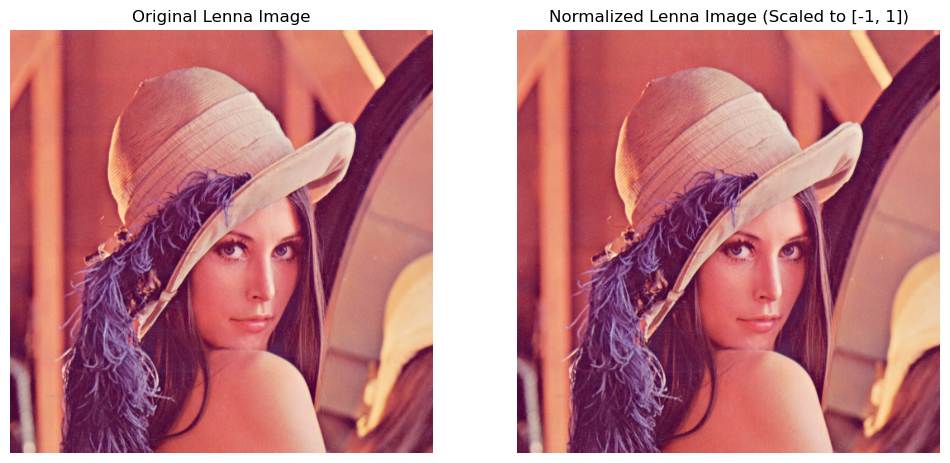

In [10]:
# Step 1: Import required libraries and download the Lenna image
import urllib.request
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# URL for Lenna image
url = "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png"
filename = "Lenna.png"

# Download the image
urllib.request.urlretrieve(url, filename)

# Load the image
image = Image.open(filename)

# Convert the image to a numpy array for processing
image_array = np.array(image)

# Step 2: Normalize the image (scale pixel values to range [-1, 1])
normalized_image_array = (image_array / 127.5) - 1

# Convert the normalized array back to an image for visualization (rescale temporarily to [0, 255] for display)
rescaled_image_array = ((normalized_image_array + 1) * 127.5).astype(np.uint8)
normalized_image = Image.fromarray(rescaled_image_array)

# Step 3: Display the original and normalized images side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Original Image
ax1.imshow(image)
ax1.axis('off')
ax1.set_title("Original Lenna Image")

# Normalized Image (showing [-1, 1] scaled back for visualization)
ax2.imshow(normalized_image)
ax2.axis('off')
ax2.set_title("Normalized Lenna Image (Scaled to [-1, 1])")

plt.show()


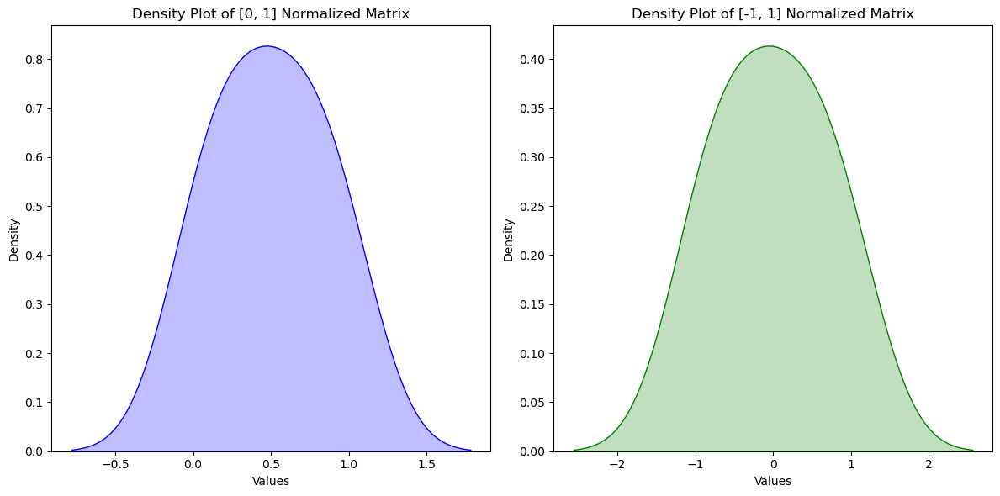

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Original Matrix
matrix = np.array([
    [0, 50, 100],
    [150, 200, 255]
])

# Normalize to [0, 1]
matrix_0_1 = (matrix - matrix.min()) / (matrix.max() - matrix.min())

# Normalize to [-1, 1]
matrix_neg1_1 = 2 * ((matrix - matrix.min()) / (matrix.max() - matrix.min())) - 1

# Flatten matrices for plotting
matrix_0_1_flat = matrix_0_1.flatten()
matrix_neg1_1_flat = matrix_neg1_1.flatten()

# Plot density for both normalized matrices
plt.figure(figsize=(12, 6))

# Density plot for [0, 1] normalized matrix
plt.subplot(1, 2, 1)
sns.kdeplot(matrix_0_1_flat, fill=True, color="blue")
plt.title("Density Plot of [0, 1] Normalized Matrix")
plt.xlabel("Values")
plt.ylabel("Density")

# Density plot for [-1, 1] normalized matrix
plt.subplot(1, 2, 2)
sns.kdeplot(matrix_neg1_1_flat, fill=True, color="green")
plt.title("Density Plot of [-1, 1] Normalized Matrix")
plt.xlabel("Values")
plt.ylabel("Density")

plt.tight_layout()
plt.show()


Original 6x6 Matrix:
[[ 1  2  3  4  5  6]
 [ 7  8  9 10 11 12]
 [13 14 15 16 17 18]
 [19 20 21 22 23 24]
 [25 26 27 28 29 30]
 [31 32 33 34 35 36]]

Resized 2x2 Matrix (Nearest Neighbor):
[[ 8 11]
 [26 29]]


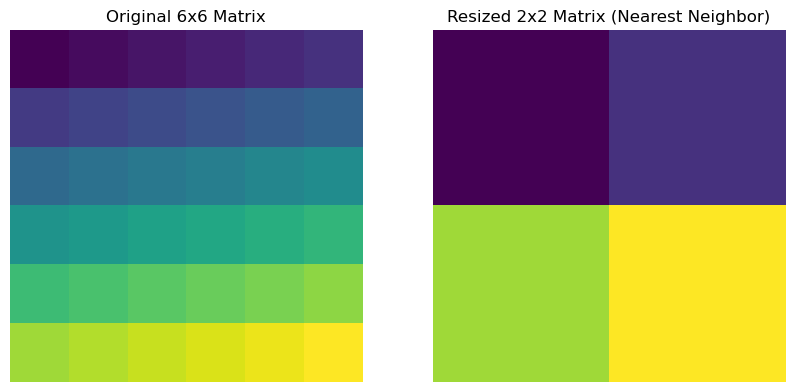

In [12]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Define the original 6x6 matrix
matrix_6x6 = np.array([
    [1, 2, 3, 4, 5, 6],
    [7, 8, 9, 10, 11, 12],
    [13, 14, 15, 16, 17, 18],
    [19, 20, 21, 22, 23, 24],
    [25, 26, 27, 28, 29, 30],
    [31, 32, 33, 34, 35, 36]
])

# Step 2: Divide the 6x6 matrix into 3x3 blocks
block_1 = matrix_6x6[:3, :3]  # Top-left
block_2 = matrix_6x6[:3, 3:6]  # Top-right
block_3 = matrix_6x6[3:6, :3]  # Bottom-left
block_4 = matrix_6x6[3:6, 3:6]  # Bottom-right

# Step 3: Extract the center (nearest neighbor) of each 3x3 block
nearest_1 = block_1[1, 1]  # Center of block 1
nearest_2 = block_2[1, 1]  # Center of block 2
nearest_3 = block_3[1, 1]  # Center of block 3
nearest_4 = block_4[1, 1]  # Center of block 4

# Step 4: Create the 2x2 resized matrix using Nearest Neighbor interpolation
matrix_2x2 = np.array([
    [nearest_1, nearest_2],
    [nearest_3, nearest_4]
])

# Print the original 6x6 matrix and the resized 2x2 matrix
print("Original 6x6 Matrix:")
print(matrix_6x6)
print("\nResized 2x2 Matrix (Nearest Neighbor):")
print(matrix_2x2)

# Step 5: Visualize the original and resized matrices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Original Matrix
ax1.imshow(matrix_6x6, cmap='viridis', interpolation='nearest')
ax1.set_title("Original 6x6 Matrix")
ax1.axis('off')

# Resized Matrix
ax2.imshow(matrix_2x2, cmap='viridis', interpolation='nearest')
ax2.set_title("Resized 2x2 Matrix (Nearest Neighbor)")
ax2.axis('off')

plt.show()


Original 6x6 Matrix:
[[ 1  2  3  4  5  6]
 [ 7  8  9 10 11 12]
 [13 14 15 16 17 18]
 [19 20 21 22 23 24]
 [25 26 27 28 29 30]
 [31 32 33 34 35 36]]

Resized 2x2 Matrix (Nearest Neighbor):
[[ 8 11]
 [26 29]]


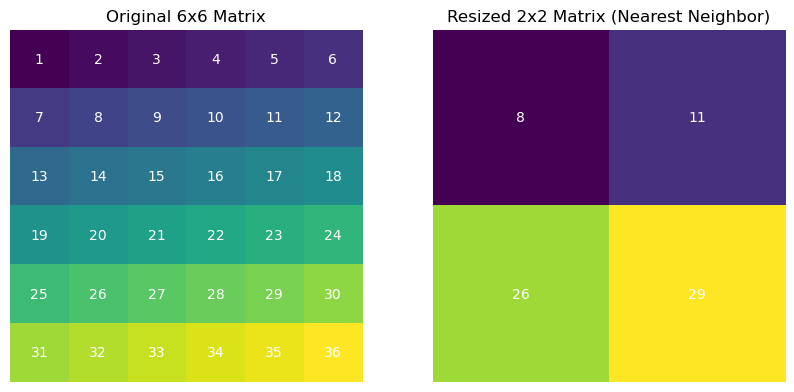

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Define the original 6x6 matrix
matrix_6x6 = np.array([
    [1, 2, 3, 4, 5, 6],
    [7, 8, 9, 10, 11, 12],
    [13, 14, 15, 16, 17, 18],
    [19, 20, 21, 22, 23, 24],
    [25, 26, 27, 28, 29, 30],
    [31, 32, 33, 34, 35, 36]
])

# Step 2: Divide the 6x6 matrix into 3x3 blocks
block_1 = matrix_6x6[:3, :3]  # Top-left
block_2 = matrix_6x6[:3, 3:6]  # Top-right
block_3 = matrix_6x6[3:6, :3]  # Bottom-left
block_4 = matrix_6x6[3:6, 3:6]  # Bottom-right

# Step 3: Extract the center (nearest neighbor) of each 3x3 block
nearest_1 = block_1[1, 1]  # Center of block 1
nearest_2 = block_2[1, 1]  # Center of block 2
nearest_3 = block_3[1, 1]  # Center of block 3
nearest_4 = block_4[1, 1]  # Center of block 4

# Step 4: Create the 2x2 resized matrix using Nearest Neighbor interpolation
matrix_2x2 = np.array([
    [nearest_1, nearest_2],
    [nearest_3, nearest_4]
])

# Print the original 6x6 matrix and the resized 2x2 matrix
print("Original 6x6 Matrix:")
print(matrix_6x6)
print("\nResized 2x2 Matrix (Nearest Neighbor):")
print(matrix_2x2)

# Step 5: Visualize the original and resized matrices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Original Matrix
ax1.imshow(matrix_6x6, cmap='viridis', interpolation='nearest')
ax1.set_title("Original 6x6 Matrix")
ax1.axis('off')

# Add text annotations for the 6x6 matrix to indicate the values clearly
for i in range(6):
    for j in range(6):
        ax1.text(j, i, str(matrix_6x6[i, j]), ha='center', va='center', color='white')

# Resized Matrix
ax2.imshow(matrix_2x2, cmap='viridis', interpolation='nearest')
ax2.set_title("Resized 2x2 Matrix (Nearest Neighbor)")
ax2.axis('off')

# Add text annotations for the 2x2 matrix
for i in range(2):
    for j in range(2):
        ax2.text(j, i, str(matrix_2x2[i, j]), ha='center', va='center', color='white')

plt.show()


In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Define the original 6x6 matrix
matrix_6x6 = np.array([
    [1, 2, 3, 4, 5, 6],
    [7, 8, 9, 10, 11, 12],
    [13, 14, 15, 16, 17, 18],
    [19, 20, 21, 22, 23, 24],
    [25, 26, 27, 28, 29, 30],
    [31, 32, 33, 34, 35, 36]
])

# Step 2: Define Bilinear interpolation function
def bilinear_interpolation(x, y, matrix):
    """ Perform bilinear interpolation for the given coordinates (x, y) on the matrix """
    x1 = int(x)
    y1 = int(y)

    x2 = x1 + 1
    y2 = y1 + 1

    # Ensure the indices are within bounds
    if x2 >= matrix.shape[0]: x2 = x1
    if y2 >= matrix.shape[1]: y2 = y1

    Q11 = matrix[x1, y1]
    Q12 = matrix[x1, y2]
    Q21 = matrix[x2, y1]
    Q22 = matrix[x2, y2]

    # Compute interpolation weights (distances)
    dx = x - x1
    dy = y - y1

    # Bilinear interpolation formula
    result = Q11 * (1 - dx) * (1 - dy) + Q21 * dx * (1 - dy) + Q12 * (1 - dx) * dy + Q22 * dx * dy
    return result

# Step 3: Create the 2x2 resized matrix using Bilinear interpolation
matrix_2x2_bilinear = np.zeros((2, 2))

# For each pixel in the resized matrix, calculate the interpolated value
for i in range(2):
    for j in range(2):
        # Calculate corresponding coordinates in the original matrix
        x = i * 3  # Each 2x2 pixel corresponds to a 3x3 block
        y = j * 3
        matrix_2x2_bilinear[i, j] = bilinear_interpolation(x, y, matrix_6x6)

# Print the original 6x6 matrix and the resized 2x2 matrix
print("Original 6x6 Matrix:")
print(matrix_6x6)
print("\nResized 2x2 Matrix (Bilinear Interpolation):")
print(matrix_2x2_bilinear)
"""
# Step 4: Visualize the original and resized matrices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Original Matrix
ax1.imshow(matrix_6x6, cmap='viridis', interpolation='nearest')
ax1.set_title("Original 6x6 Matrix")
ax1.axis('off')

# Resized Matrix
ax2.imshow(matrix_2x2_bilinear, cmap='viridis', interpolation='nearest')
ax2.set_title("Resized 2x2 Matrix (Bilinear Interpolation)")
ax2.axis('off')

plt.show()
"""

Original 6x6 Matrix:
[[ 1  2  3  4  5  6]
 [ 7  8  9 10 11 12]
 [13 14 15 16 17 18]
 [19 20 21 22 23 24]
 [25 26 27 28 29 30]
 [31 32 33 34 35 36]]

Resized 2x2 Matrix (Bilinear Interpolation):
[[ 1.  4.]
 [19. 22.]]


'\n# Step 4: Visualize the original and resized matrices\nfig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))\n\n# Original Matrix\nax1.imshow(matrix_6x6, cmap=\'viridis\', interpolation=\'nearest\')\nax1.set_title("Original 6x6 Matrix")\nax1.axis(\'off\')\n\n# Resized Matrix\nax2.imshow(matrix_2x2_bilinear, cmap=\'viridis\', interpolation=\'nearest\')\nax2.set_title("Resized 2x2 Matrix (Bilinear Interpolation)")\nax2.axis(\'off\')\n\nplt.show()\n'

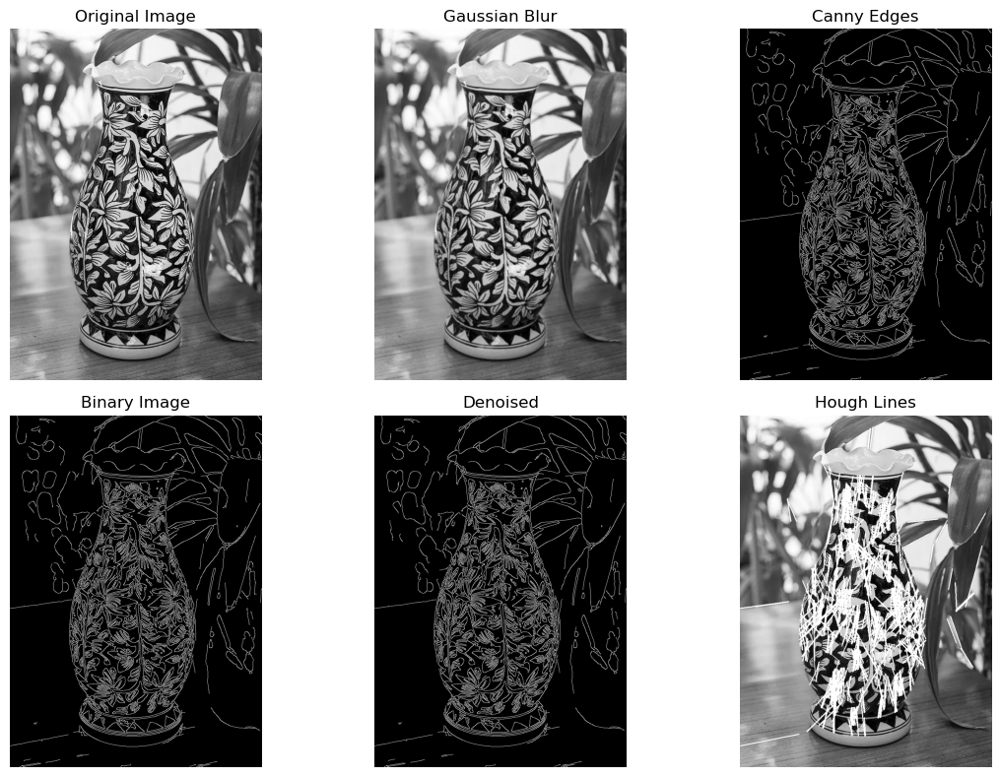

In [1]:
# Importing libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Loading image
image = cv2.imread(r"C:\Users\yamun\Downloads\assi1.png", cv2.IMREAD_GRAYSCALE)

# Gaussian Blur
blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Canny Edge Detection
edges = cv2.Canny(blurred, 50, 150)

# Convert to Binary
_, binary_image = cv2.threshold(edges, 127, 255, cv2.THRESH_BINARY)

# Preprocessing (Additional denoising)
denoised = cv2.fastNlMeansDenoising(binary_image, h=30)

# Hough Transform
lines = cv2.HoughLinesP(denoised, 1, np.pi / 180, threshold=100, minLineLength=50, maxLineGap=10)

# Draw the detected lines on the image
line_image = np.copy(image)
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), 2)

# results
titles = ['Original Image', 'Gaussian Blur', 'Canny Edges', 'Binary Image', 'Denoised', 'Hough Lines']
images = [image, blurred, edges, binary_image, denoised, line_image]

plt.figure(figsize=(12, 8))
for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()